In [3]:
import os
import pandas as pd
import datetime
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [4]:
os.getcwd()

'/Users/ryanfisher/Documents/Springboard/Springboard/Capstone 3'

In [5]:
os.listdir()

['Capstone 3 - Preprocessing.ipynb',
 'Capstone 3 - Data Wrangling.ipynb',
 'Capstone 3 - Data Wrangling-Copy1.ipynb',
 'data_by_genres.csv',
 'data.csv',
 'data_by_artist.csv',
 'Capstone 3 - EDA.ipynb',
 'data_by_year.csv',
 'data_w_genres.csv',
 '.ipynb_checkpoints']

In [6]:
df = pd.read_csv('data_by_artist.csv')
df.head()

,mode,count,acousticness,artists,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,9,0.590111,"""Cats"" 1981 Original London Cast",0.467222,250318.555556,0.394003,0.011400,0.290833,-14.448000,0.210389,117.518111,0.389500,38.333333,5
1,1,26,0.862538,"""Cats"" 1983 Broadway Cast",0.441731,287280.000000,0.406808,0.081158,0.315215,-10.690000,0.176212,103.044154,0.268865,30.576923,5
2,1,7,0.856571,"""Fiddler On The Roof” Motion Picture Chorus",0.348286,328920.000000,0.286571,0.024593,0.325786,-15.230714,0.118514,77.375857,0.354857,34.857143,0
3,1,27,0.884926,"""Fiddler On The Roof” Motion Picture Orchestra",0.425074,262890.962963,0.245770,0.073587,0.275481,-15.639370,0.123200,88.667630,0.372030,34.851852,0
4,1,7,0.510714,"""Joseph And The Amazing Technicolor Dreamcoat""...",0.467143,270436.142857,0.488286,0.009400,0.195000,-10.236714,0.098543,122.835857,0.482286,43.000000,5


In [7]:
df.describe()

,mode,count,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
count,28680.000000,28680.000000,28680.000000,28680.000000,2.868000e+04,28680.000000,28680.000000,28680.000000,28680.000000,28680.000000,28680.000000,28680.000000,28680.000000,28680.000000
mean,0.759170,13.847211,0.498373,0.546490,2.388780e+05,0.497488,0.174756,0.202441,-11.140498,0.094014,115.844830,0.512723,34.060945,5.412901
std,0.427595,53.372544,0.370614,0.176474,1.211318e+05,0.254885,0.298406,0.140884,5.771749,0.111986,25.003834,0.244421,22.376438,3.480552
min,0.000000,1.000000,0.000000,0.000000,1.879550e+04,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,2.000000,0.122296,0.431000,1.823304e+05,0.283568,0.000004,0.110363,-13.972292,0.039200,99.366500,0.329000,12.000000,2.000000
50%,1.000000,3.000000,0.478458,0.557000,2.186400e+05,0.504000,0.001880,0.161000,-10.088938,0.052200,115.357400,0.523243,39.000000,6.000000
75%,1.000000,8.000000,0.896000,0.675000,2.684670e+05,0.702783,0.215291,0.247000,-6.889000,0.095300,129.848750,0.703000,51.000000,8.000000
max,1.000000,3169.000000,0.996000,0.986000,5.403500e+06,1.000000,1.000000,0.991000,1.342000,0.964000,217.743000,0.991000,93.000000,11.000000


In [8]:
df.dtypes

mode                  int64
count                 int64
acousticness        float64
artists              object
danceability        float64
duration_ms         float64
energy              float64
instrumentalness    float64
liveness            float64
loudness            float64
speechiness         float64
tempo               float64
valence             float64
popularity          float64
key                   int64
dtype: object

In [9]:
df.columns

Index(['mode', 'count', 'acousticness', 'artists', 'danceability',
       'duration_ms', 'energy', 'instrumentalness', 'liveness', 'loudness',
       'speechiness', 'tempo', 'valence', 'popularity', 'key'],
      dtype='object')

/Users/ryanfisher/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  import sys


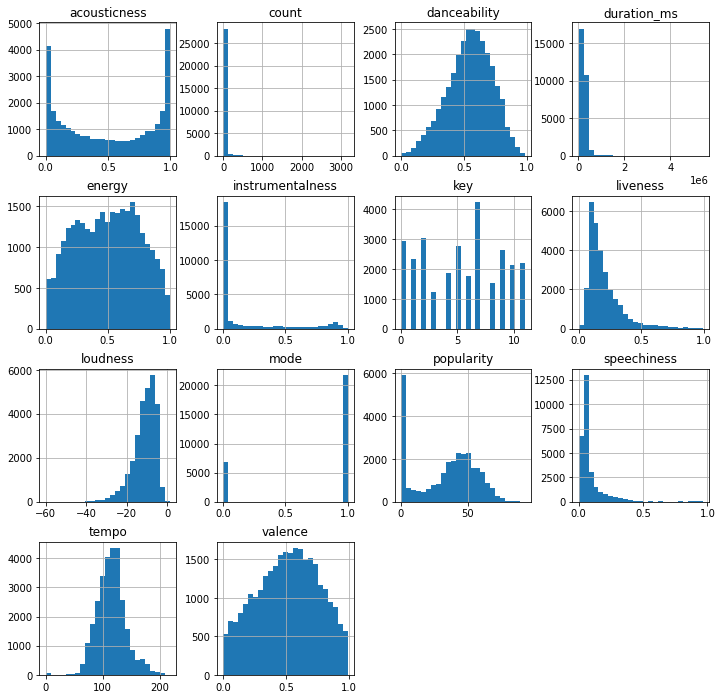

In [10]:
fig, axes = plt.subplots(len(df.columns)//3, 3, figsize=(12, 12))

i = 0
for triaxis in axes:
    for axis in triaxis:
        df.hist(column = ['mode', 'count', 'acousticness', 'danceability', 'duration_ms', 'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo', 'valence', 'popularity', 'key'], 
                            bins = 25, ax=axis)
        i = i+1

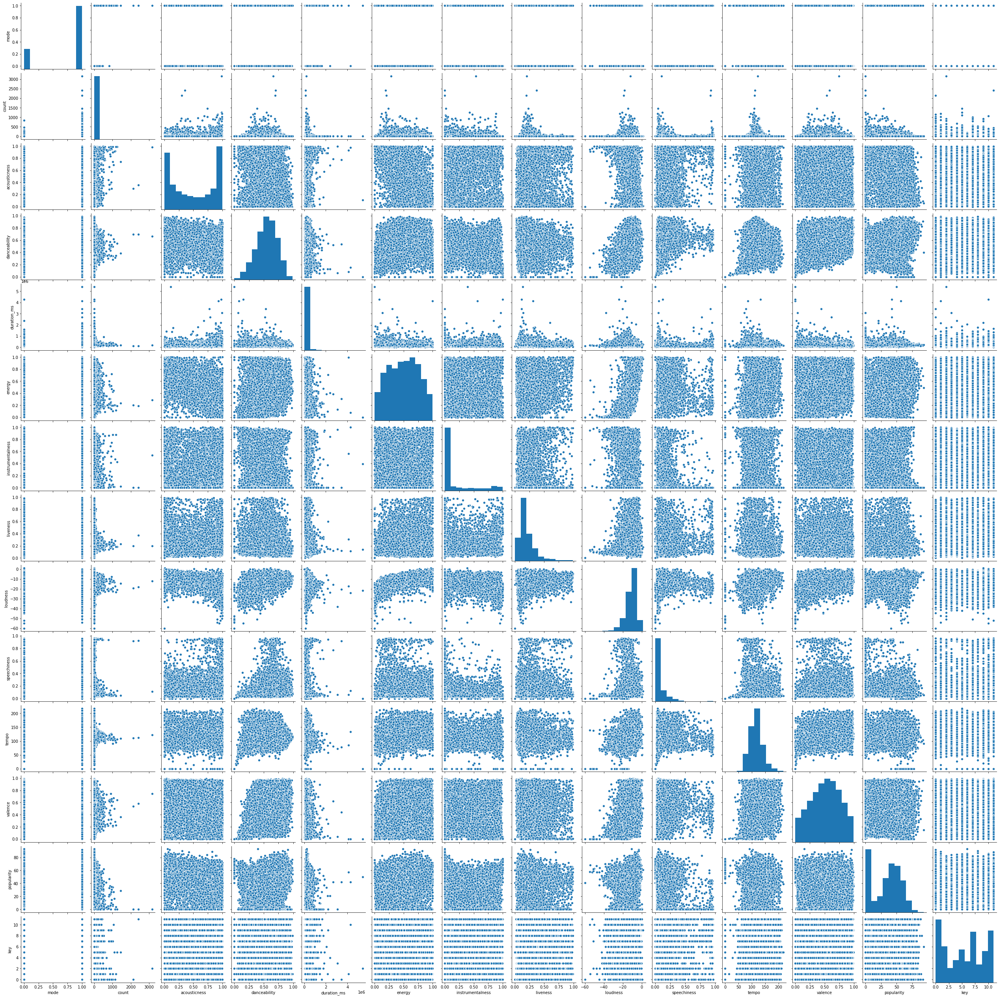

In [8]:
sns.pairplot(df)

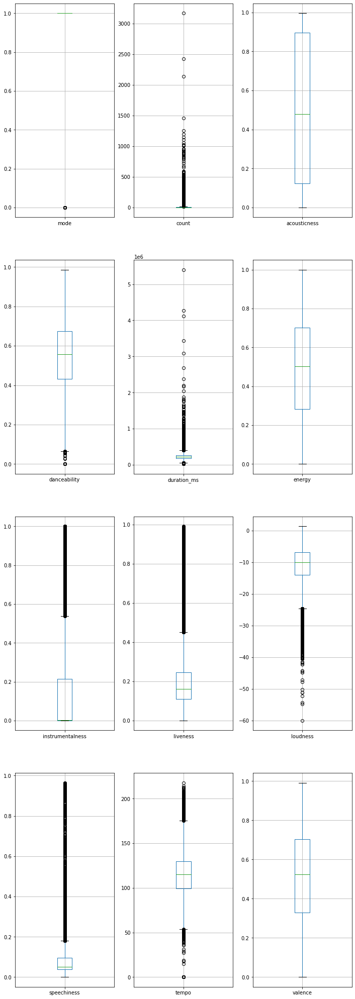

In [11]:
cols = df.select_dtypes([np.float64,np.int64]).columns

fig, axes = plt.subplots(len(cols)//3, 3, figsize=(12, 36))

i = 0
for triaxis in axes:
    for axis in triaxis:
        df.boxplot(column = cols[i],  ax=axis)
        i = i+1

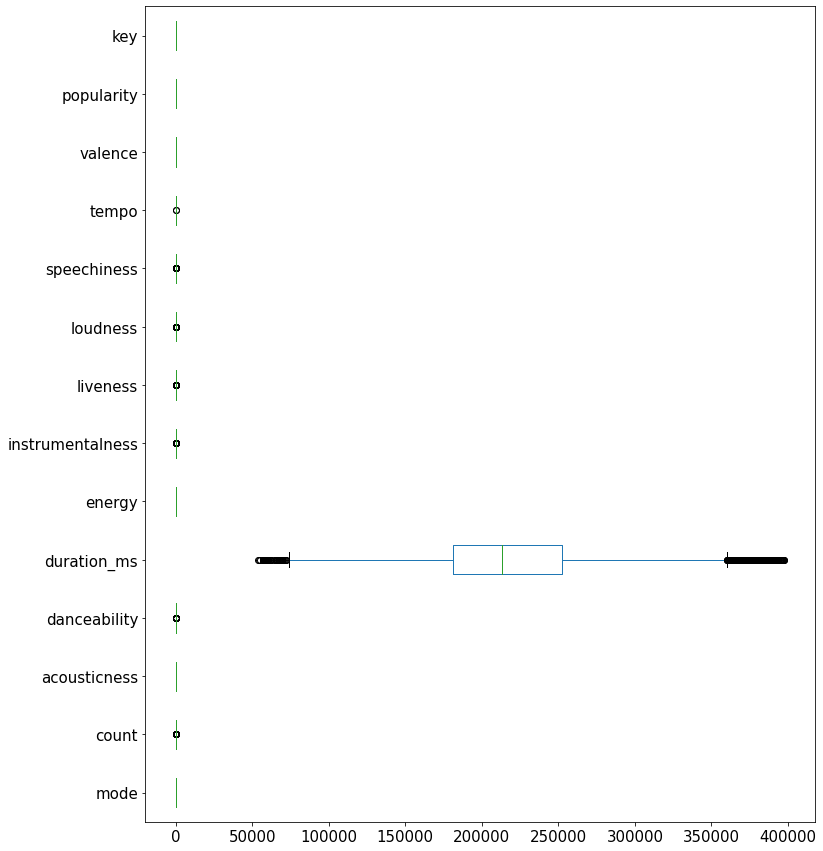

In [12]:
# Let's get the Interquartile range, or IQR. This is equal to Q3 - Q1. 
# First, let's use the quantile() method to get the first quartile, and store it in a variable called Q1.
# We'll want to plug 0.25 into the quantile method. 
Q1 = df.quantile(.25, axis=0)

# Now get Q3 and store in a variable called Q3. 
Q3 = df.quantile(.75, axis=0)

# Now calculate the IQR, storing it in a variable called IQR.
IQR = Q3 - Q1
# Make a variable called `dfno`, and assign it the value: df[~((df < (Q1 - 1.5 * IQR)) |(df> (Q3 + 1.5 * IQR))).any(axis=1)]. 
# This filters on our existing dataframe, picking out just those observations that are NOT outliers. 
dfno = df[~((df < (Q1 - 1.5 * IQR)) |(df> (Q3 + 1.5 * IQR))).any(axis=1)]
# We now want to make a boxplot of this new dataframe dfno. 
bp = dfno.boxplot(grid=False, vert=False,fontsize=15, figsize=(12,15))

In [13]:
print(df.shape)
print(dfno.shape)

(28680, 15)
(11618, 15)


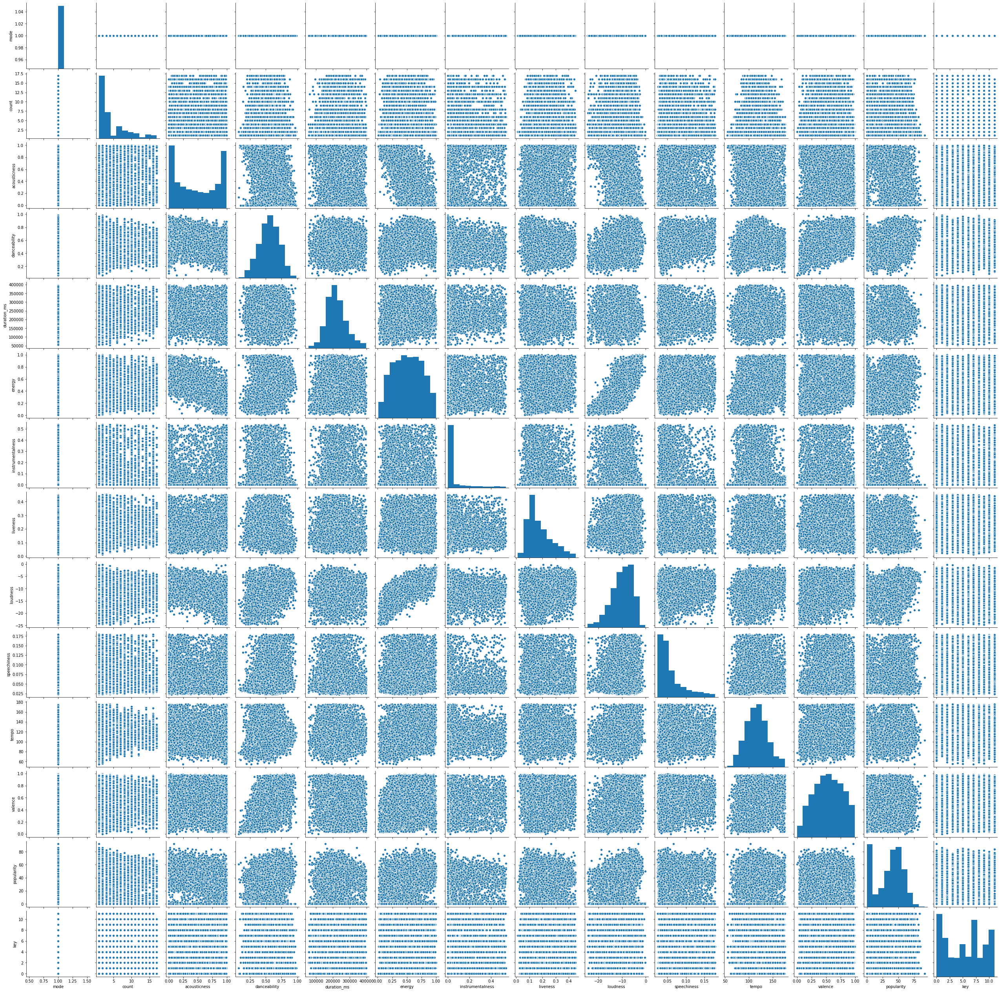

In [55]:
sns.pairplot(dfno)

In [14]:
corr = dfno.corr()
#plot it in the next line
corr.round(2).style.background_gradient(cmap='coolwarm')

/Users/ryanfisher/opt/anaconda3/lib/python3.7/site-packages/pandas/io/formats/style.py:1089: RuntimeWarning: All-NaN slice encountered
  smin = np.nanmin(s.to_numpy()) if vmin is None else vmin
/Users/ryanfisher/opt/anaconda3/lib/python3.7/site-packages/pandas/io/formats/style.py:1090: RuntimeWarning: All-NaN slice encountered
  smax = np.nanmax(s.to_numpy()) if vmax is None else vmax


,mode,count,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
mode,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
count,nan,1.000000,-0.040000,-0.020000,0.060000,0.040000,0.100000,0.100000,0.010000,0.060000,0.070000,0.040000,0.020000,0.070000
acousticness,nan,-0.040000,1.000000,-0.370000,-0.230000,-0.810000,0.130000,0.070000,-0.630000,-0.060000,-0.270000,-0.210000,-0.580000,-0.020000
danceability,nan,-0.020000,-0.370000,1.000000,-0.020000,0.340000,-0.140000,-0.170000,0.360000,0.210000,0.080000,0.590000,0.320000,-0.010000
duration_ms,nan,0.060000,-0.230000,-0.020000,1.000000,0.130000,0.070000,-0.060000,0.040000,-0.050000,0.010000,-0.160000,0.180000,-0.000000
energy,nan,0.040000,-0.810000,0.340000,0.130000,1.000000,-0.090000,0.030000,0.810000,0.130000,0.300000,0.380000,0.470000,0.020000
instrumentalness,nan,0.100000,0.130000,-0.140000,0.070000,-0.090000,1.000000,0.030000,-0.190000,-0.000000,-0.040000,-0.060000,-0.190000,0.030000
liveness,nan,0.100000,0.070000,-0.170000,-0.060000,0.030000,0.030000,1.000000,0.020000,0.100000,-0.050000,-0.010000,-0.160000,-0.010000
loudness,nan,0.010000,-0.630000,0.360000,0.040000,0.810000,-0.190000,0.020000,1.000000,0.080000,0.240000,0.280000,0.450000,0.020000
speechiness,nan,0.060000,-0.060000,0.210000,-0.050000,0.130000,-0.000000,0.100000,0.080000,1.000000,0.040000,0.120000,-0.000000,-0.010000


In [42]:
#Preprocessing

In [73]:
from sklearn import preprocessing
from sklearn.cluster import KMeans

df2 = dfno.drop(['mode','count','artists'], axis =1)
X = df2.values
#scaler = preprocessing.StandardScaler().fit(X)
X=preprocessing.StandardScaler().fit_transform(X)

In [74]:
X

array([[ 1.04890291, -1.30478772,  1.88110957, ..., -0.02306644,
        -1.54550485,  1.62090315],
       [ 0.08223256, -0.5499818 ,  0.87578419, ...,  0.35316302,
        -0.09371997, -1.43483045],
       [-1.34487234, -0.25241409,  1.92098989, ...,  1.09242092,
         0.48699398, -0.18475761],
       ...,
       [ 0.08582613, -1.25579792, -0.35609038, ..., -0.01646593,
         1.3580649 , -0.87924252],
       [ 0.85013129,  0.10841151, -0.77191615, ..., -0.57090935,
        -0.09371997, -1.36538196],
       [ 0.24234607, -0.67789963,  0.3128504 , ..., -0.2012804 ,
         1.3580649 , -0.87924252]])

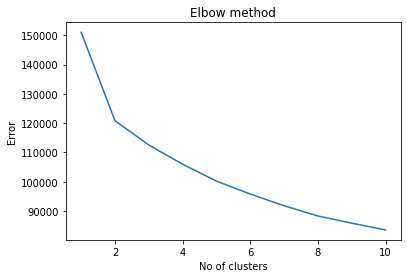

In [75]:
Error =[]
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i).fit(X)
    kmeans.fit(X)
    Error.append(kmeans.inertia_)
import matplotlib.pyplot as plt
plt.plot(range(1, 11), Error)
plt.title('Elbow method')
plt.xlabel('No of clusters')
plt.ylabel('Error')
plt.show()

In [88]:
#Modeling

In [76]:
kmeans = KMeans(n_clusters=3)
y_kmeans = kmeans.fit_predict(X)
df2['cluster']=y_kmeans
df2.head()

,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,cluster
2,0.856571,0.348286,328920.000000,0.286571,0.024593,0.325786,-15.230714,0.118514,77.375857,0.354857,34.857143,0,2
4,0.510714,0.467143,270436.142857,0.488286,0.009400,0.195000,-10.236714,0.098543,122.835857,0.482286,43.000000,5,1
11,0.000122,0.514000,331240.000000,0.899000,0.079300,0.367000,-5.115000,0.060200,174.028000,0.266000,59.000000,7,1
14,0.624769,0.563615,314023.615385,0.457692,0.000009,0.204385,-8.338462,0.152454,117.006846,0.467538,47.692308,7,1
17,0.105556,0.557125,255213.500000,0.612250,0.023300,0.127588,-9.638125,0.032150,103.080250,0.532625,34.625000,0,1


In [77]:
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

pca = PCA(n_components=2)
pca_model = pca.fit(X).transform(X)

In [79]:
pca_df = pd.DataFrame(data = pca_model, columns = ['component1', 'component2'] )
pca_df.head()

,component1,component2
0,2.163277,-0.204316
1,-0.017870,0.858076
2,-2.422177,2.200346
3,-0.425767,0.431481
4,-0.613010,0.657036


In [80]:
pc1 = pca_df['component1']
pc2 = pca_df['component2']

<Figure size 432x288 with 0 Axes>

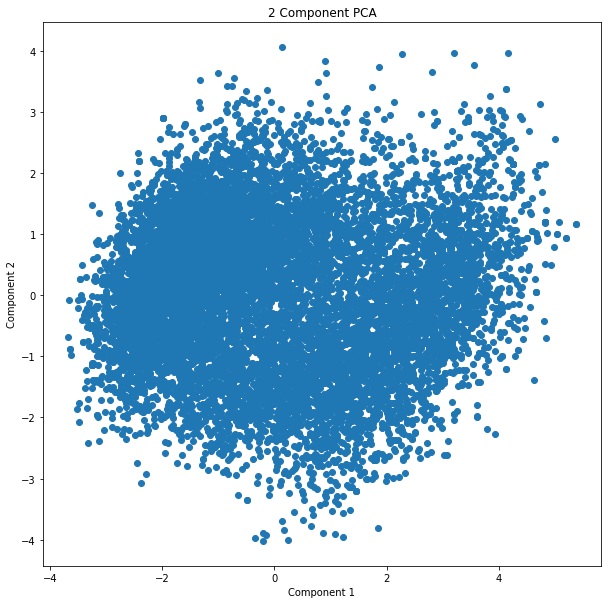

In [81]:
plt.figure()
plt.figure(figsize=(10,10))
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('2 Component PCA')
plt.scatter(pca_df['component1'], pca_df['component2']) 

<Figure size 432x288 with 0 Axes>

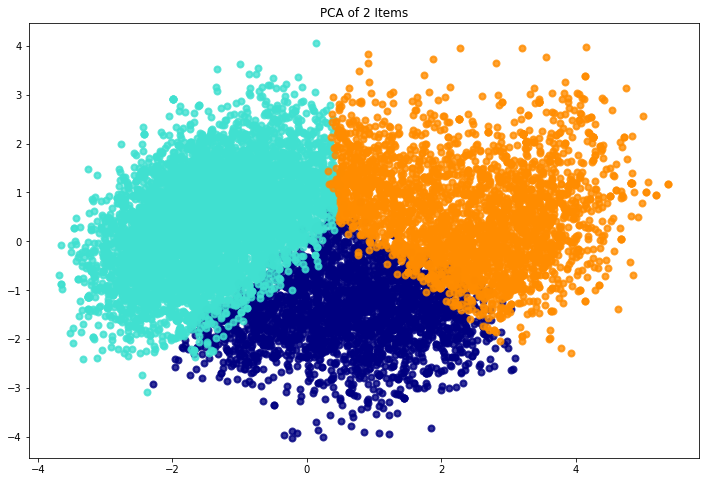

In [84]:
# Plotting the data
plt.figure()
plt.figure(figsize=(12,8))
colors = ['navy', 'turquoise', 'darkorange']
lw = 2


for color, i in zip(colors, [0, 1, 2]):
    plt.scatter(pca_model[y_kmeans == i, 0], pca_model[y_kmeans == i, 1], color=color, alpha=.8, lw=lw)
    
plt.title('PCA of 2 Items')
plt.show()